(sec-us-top)=

<div align="center">
    <h1>Unsupervised Learning </h1>
    <a href="https://github.com/bernalde">David E. Bernal Neira</a>
    <br>
    <i>Davidson School of Chemical Engineering, Purdue University</i>
    <br>
    <a href="https://colab.research.google.com/github/SECQUOIA/PU_CHE597_DSinChemE/blob/main/14-Deep_Learning/deep_learning.ipynb" target="_parent">
        <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
    </a>
    <a href="https://secquoia.github.io/">
        <img src="https://img.shields.io/badge/🌲⚛️🌐-SECQUOIA-blue" alt="SECQUOIA"/>
    </a>
</div>

# Unsupervised Learning
## Table of Contents
- [Unsupervised Learning](#sec-us-main)
  - [Clustering](#sec-us-cluster)
    - [K-Means](#sec-us-kmeans)
      - [scikit-learn example](#sec-us-sklearn)
      - [Elbow Plot](#sec-us-elbow)
      - [Silhouette Score](#sec-us-silhouette)
  - [Factors that Affect Clustering](#sec-us-factors)
    - [Custom Data Generation](#sec-us-datagen)
    - [Overlaps](#sec-us-overlap)
    - [Non-Spherical Clusters](#sec-us-nonsphere)
    - [Varying Density](#sec-us-density)
    - [Non-Linear Clusters](#sec-us-nonlinear)
- [Mini-Batch K-Means](#sec-us-minibatch)
- [Gaussian Mixtures](#sec-us-gmm)
- [DBSCAN](#sec-us-dbscan)
- [Hierachical Clustering](#sec-us-hier)
- [Comparison of Methods](#sec-us-compare)

(sec-us-main)=
## Unsupervised Learning ##
Unsupervised learning is one of the four common branches of machine learning which is concerned with identifying relationships within unlabeled data. In contrast to supervised learning, where labels indicate the target property for model development, unsupervised learning is used when the target is unknown. 

Since we don't have labels in unsupervised learning, the "error" of our models is not easy to define. That is, we don't know the answer and so we can't easily analyze the result. Thus unsupervised learning models are most commonly judged based on their usefulness. For instance, when exploring high dimensional datasets, finding organization structures that provide easy visualization or insight into relationships among variables are common uses of unsupervised models. 

(sec-us-cluster)=
### Clustering ###
Identifying "clusters" is one useful way to think about revealing structure within data. Here a <b>cluster</b> refers to a group of data that have something in common relative to the rest of the dataset. A cluster model typically takes vectorized data along with some hyperparameters and returns a set of labels for each datapoint assigning it to a cluster. 

Since there is no unique way to cluster data, many algorithms/models exist for this approach. You will find that algorithms differ in (i) the kinds of relationships they tend to reveal in the data and (ii) types of data they work well on. For instance, some algorithms work well on low density data, and others on more clumpy data (if you aren't sure what these terms mean, you will see examples below). For these reasons, the usefulness of a given clustering algorithm will depend strongly on application. There is no universal best-solution to this problem, it will depend on the structure of your data and the kinds of relationships you are most interested in. 

(sec-us-kmeans)=
### K-Means ###
<b>K-Means</b> is the most common clustering algorithm and many more sophisticated algorithms are built on top of its ideas. For this reason we will discuss several unsupervised learning concepts in the context of k-means in detail, while for the rest of the algorithms we will just demonstrate their use and comment on their tradeoffs. 

The object in k-means is to partition n datapoints into k clusters such that the variance within each cluster is minimized. Mathematically this is expressed as obtaining clusters $S_\mathrm{i}$ such that

$$\sum_{i}^{k}\sum_{\mathbf{r}\in S_{i}}||\mathbf{r} - \mu_i||^2 $$
is minimized, where $S_i$ is the set of data in cluster "i", $\mathbf{r}$ is the position of the point, and $\mu_{i}$ is the position of the cluster ($S_{i}$) mean. In the optimization community you would say "$\mathrm{argmin}_\mathbf{S} ...$" to denote the objective function to be minimized with respect to S.


<b>algorithm:</b> 

1. assign k-means by selecting k datapoints at random (Forgy)
2. loop over all datapoints and assign each to the cluster whose mean is nearest
3. recalculate cluster means based on the added points
4. repeat step 2. until there is no significant change in cluster membership

A couple notes about the algorithm. First, it is sensitive to how it is initialized. There is a tendency for k-means to fall into local minima, so you might want to run the algorithm multiple times to check consistency. Put differently, there is no guarrantee that k-means finds the globally optimal solution. Second, the definition of "nearest" here is flexible. The most common distance measure is the L2 norm ("Euclidean") but other measures can be used in the algorithm. Third, there are several initialization methods for step 1 besides the Forgy procedure. Fourth, the algorithm requires you to know how many clusters you want in advance! 

(sec-us-sklearn)=
#### scikit-learn example ###
Even though this is a simple algorithm, we don't need to write our own implementation because scikit-learn developers have already done the work for us. The cell below demonstrates how to use the scikit-learn `sklearn.cluster.KMeans` object as well as the `make_blobs` class for generating useful clustering datasets. Note that the `KMeans` object is the same as we used before in the classification lecture. It has a `.fit` method, and a `.fit_predict()` method, where the latter just combines the fitting and the cluster assignments in one step:


Text(0.5, 1.0, 'k=15')

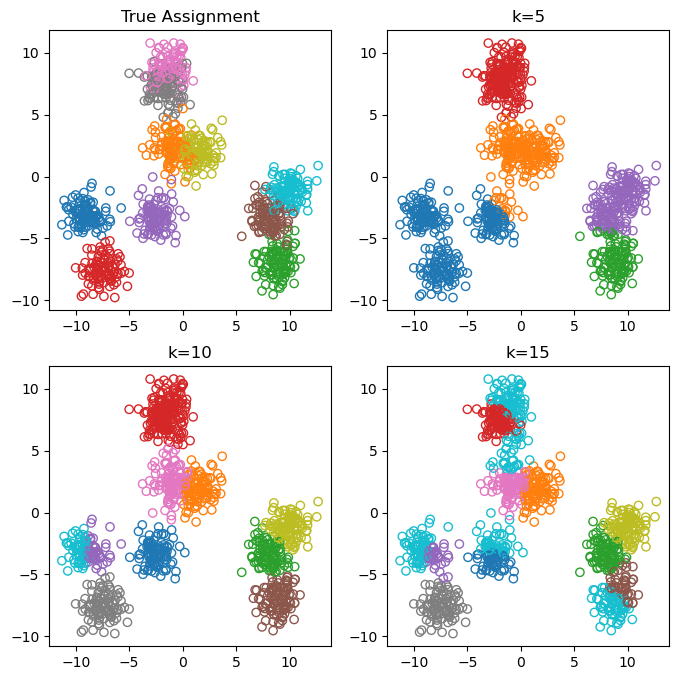

In [1]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

n_samples = 1000
random_state = 1234214   # This will ensure that everyone gets the same results

# Generate two dimensional blob dataset
# r is the position of each point
# y is the classification
r, y = make_blobs(n_samples=n_samples, random_state=random_state,centers=10)

# Plot unclassified data
plt.figure(figsize=(8,8))
plt.subplot(221)
plt.scatter(r[:,0],r[:,1],facecolors='none',edgecolors=cm.tab10(y))
plt.title("True Assignment")

# Apply KMeans for five clusters (note: we combine the initialization and call to the fit_predict method in one step)
labels = KMeans(n_clusters=5, random_state=random_state).fit_predict(r)
plt.subplot(222)
plt.scatter(r[:,0],r[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=5")

# k=10
labels = KMeans(n_clusters=10, random_state=random_state).fit_predict(r)
plt.subplot(223)
plt.scatter(r[:,0],r[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=10")

# k=15
labels = KMeans(n_clusters=15, random_state=random_state).fit_predict(r)
plt.subplot(224)
plt.scatter(r[:,0],r[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=15")

(sec-us-elbow)=
#### Elbow Plot ####
A couple questions should occur at this point. First, how do we know how many clusters is "right"? The short answer is that you don't, because this is an unsupervised problem. Of course, in this case, we know the labels and so we could in principle compare the results of the clustering as if this were a classification problem. In particular, you will see unsupervised algorithms often tested on supervised classification problems to document their behaviors. Some additional error metrics that are useful in this regard is the mutual information and Rand index (XXX To be added XXX. 

But what about if we don't know the correct labels? How do we know what the "right" number of clusters is? If you look at the examples above, you might think that "I know it when I see it". But there are several ways to try and formalize our intuition for useful clusterings. Intuitively, we want to minimize the number of clusters while also minimizing the variance within cluster. However, the within cluster variance monotonically decreases with the number of clusters (e.g., in the limiting cases, k=1 and k=number of samples, the variance ranges from the max to 0). For the situation with well separated clusters, we might note that the within cluster variance will fall fast when k is less than the number of clusters and more slowly when k is greater than the number of well separated clusters. Plotting the within-cluster variance (also known as the <b>inertia</b>) versus k would exhibit an "elbow" in this case, where the "best" k would occur. In practice, such sharp elbows only occur in idealized situations (e.g., well separated clusters, spherical clusters, similarly sized clusters), but it is usually a judgement call. Let's make an elbow plot for our current problem:

Text(0.5, 1.0, 'Elbow Plot')

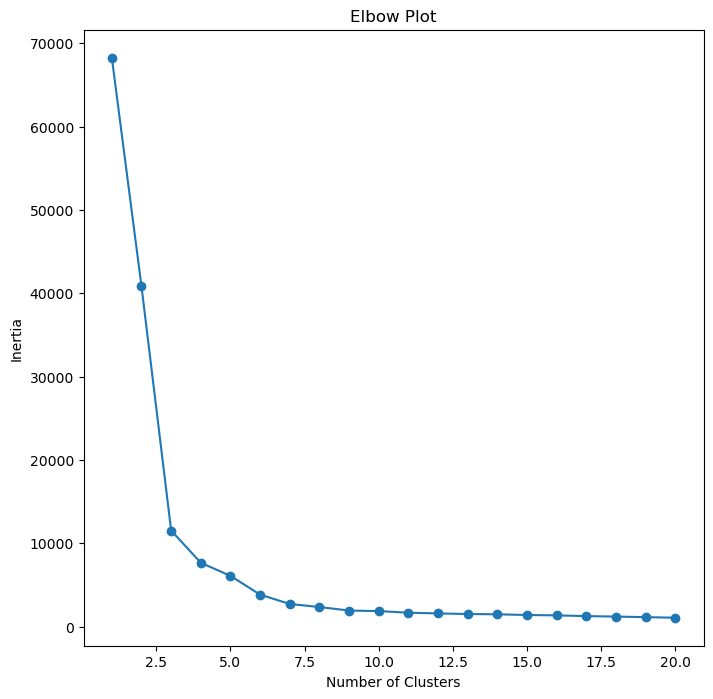

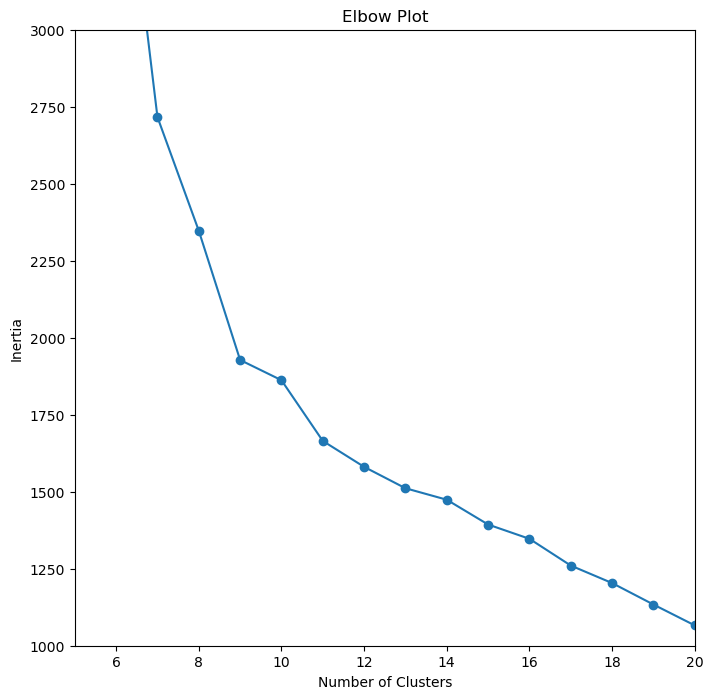

In [2]:
# Elbow plot example for blobs
inertia = []
for i in range(1,21):
    random_state = 1234214   # This will ensure that everyone gets the same results
    inertia += [KMeans(n_clusters=i, random_state=random_state).fit(r).inertia_]

plt.figure(figsize=(8,8))
plt.plot(range(1,21),inertia,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot")

plt.figure(figsize=(8,8))
plt.plot(range(1,21),inertia,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.xlim(5,20)
plt.ylim(1000,3000)
plt.title("Elbow Plot")


In the above example we have used the fact that the inertia (sum of within cluster variances) is an attribute of the `KMeans` object (i.e., the `.inertia_` call in the above cell). 

(sec-us-silhouette)=
#### Silhouette Score ####
A second intuitive metric for understanding how well the clusters separate the data is the <b>silhouette score</b>. This is essentially a normalized complement to the interia. Specifically, one calculates the mean within cluster distance ($\langle r_\mathrm{in} \rangle$) and mean nearest cluster distance ($\langle r_\mathrm{out} \rangle$) for each sample. The silhouette score is normalized by the maximum of $\langle r_\mathrm{in} \rangle$ and $\langle r_\mathrm{out} \rangle$, so that it is near 1 for samples that are much closer to their centroid than another, 0 for samples that are equidistant to a neighboring cluster, and -1 for samples that are closer to a neighboring cluster:

$$S_i = \frac{\langle r_\mathrm{out} \rangle - \langle r_\mathrm{in} \rangle}{\mathrm{max}\left(\langle r_\mathrm{in} \rangle,\langle r_\mathrm{out} \rangle \right)}$$

The scikit-learn functions `sklearn.metrics.silhouette_score()` and `sklearn.metrics.silhouette_samples()` calculate the average score across all samples and the score for each sample, respectively. The latter is useful for ploting the distribution of scores. Let's experiment on our problem:


Text(0.5, 1.0, 'Elbow Plot')

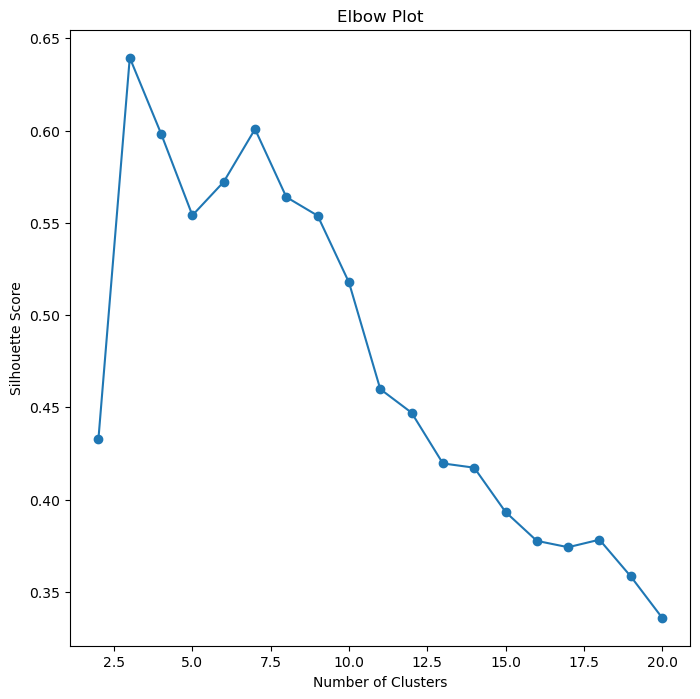

In [3]:
from sklearn.metrics import silhouette_score

# Generate silhouette plot
S = []
for i in range(2,21):
    random_state = 1234214   # This will ensure that everyone gets the same results
    S += [silhouette_score(r,KMeans(n_clusters=i, random_state=random_state).fit_predict(r))]

plt.figure(figsize=(8,8))
plt.plot(range(2,21),S,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Elbow Plot")


Based on the silhouette score, there is nothing obvious about $k=10$. Has something gone wrong? We think of $k=10$ being the "correct" answer, because we generated the data in this toy example based on 10 distinct gaussian blobs. But, it is quite possible that other partitions make sense. Let's replot the clustering results with each k value and also take a look at the distribution of silhouette values across samples:

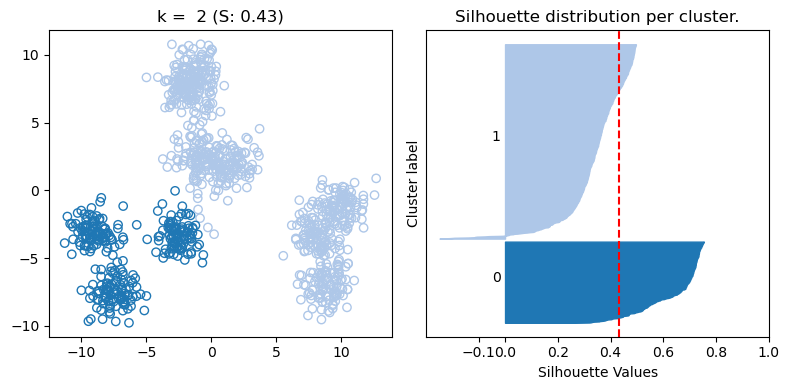

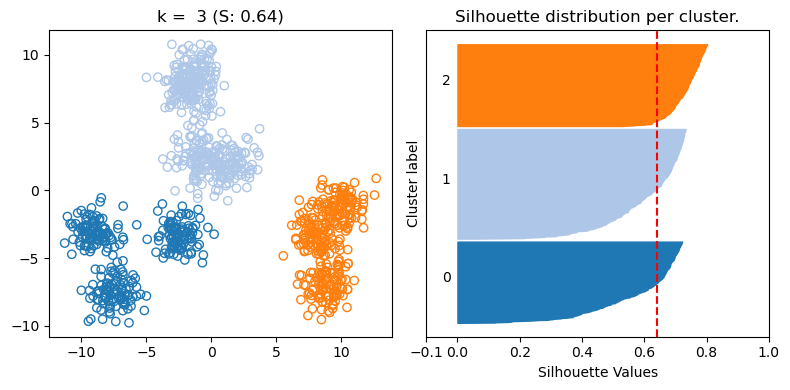

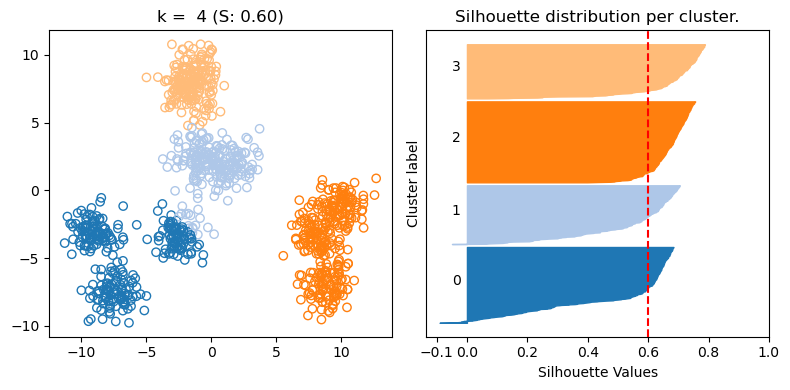

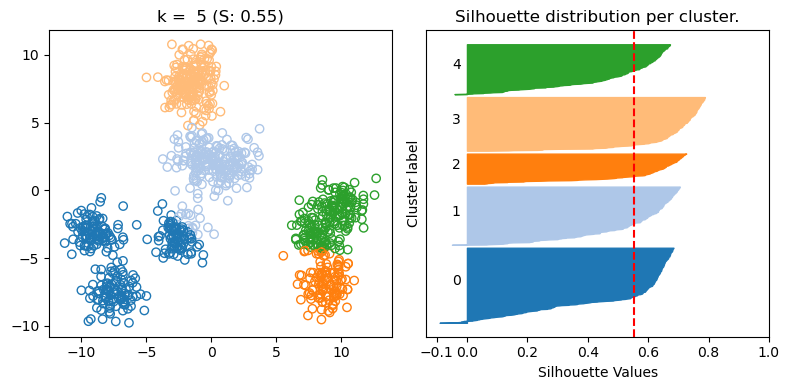

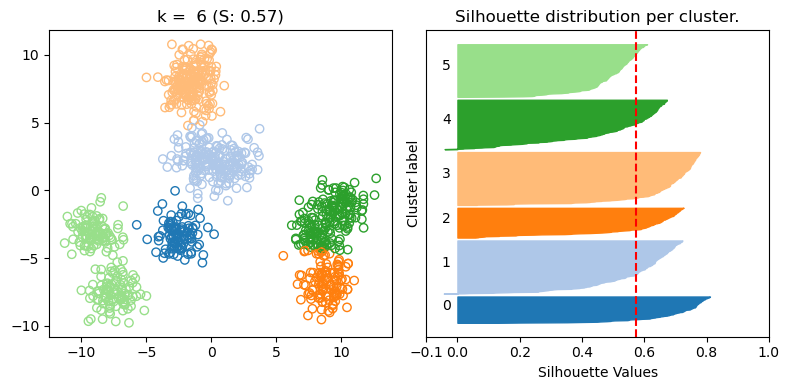

...

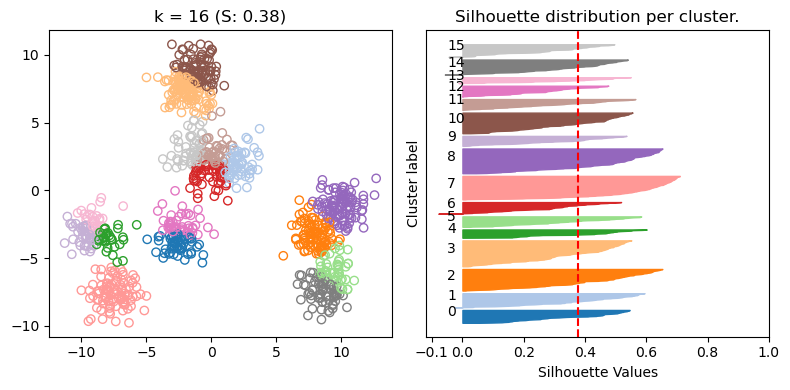

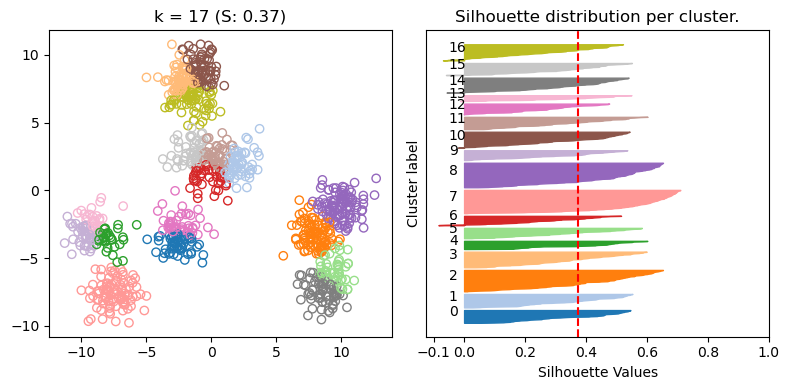

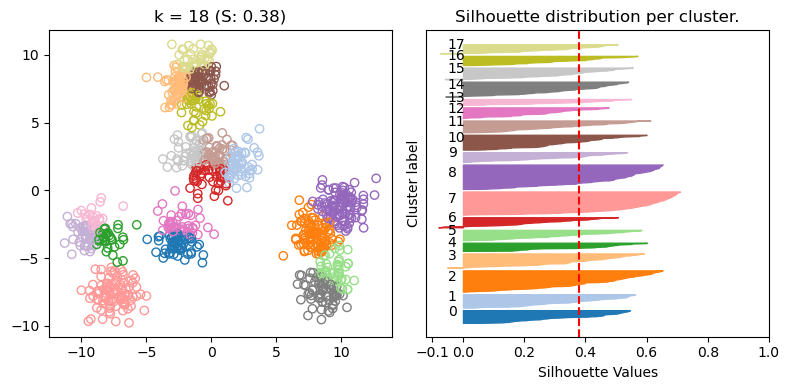

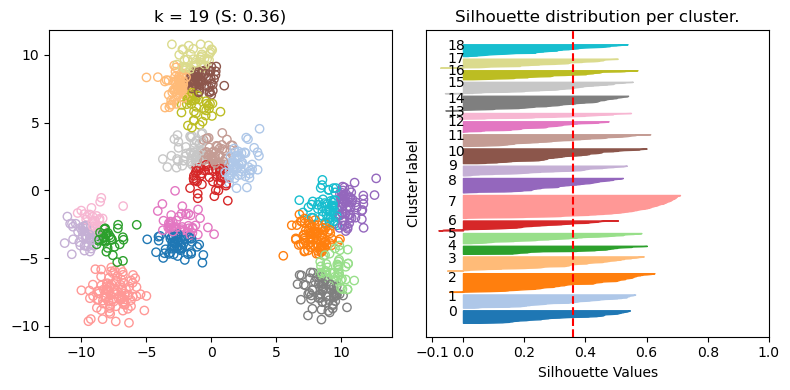

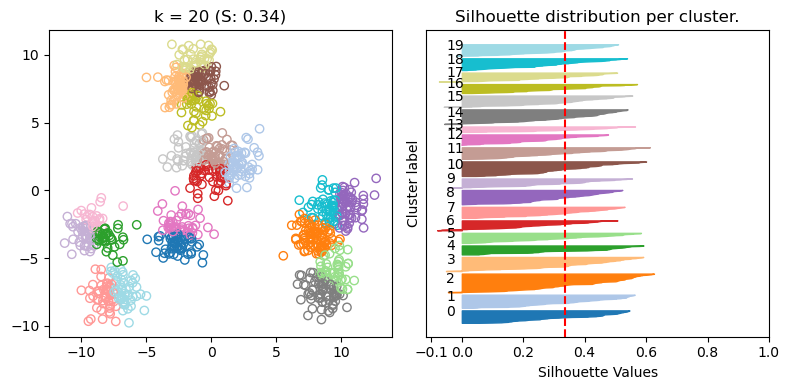

In [4]:
from sklearn.metrics import silhouette_samples
from matplotlib import cm

# Generate silhouette distribution and clusters
for i in range(2,21):
    random_state = 1234214   # This will ensure that everyone gets the same results
    labels = KMeans(n_clusters=i, random_state=random_state).fit_predict(r)

    # Compute the mean and distribution of silhouette scores for each sample
    S = silhouette_score(r,labels)
    sample_silhouette_values = silhouette_samples(r, labels)

    # Make assignment plot
    plt.figure(figsize=(8,4))
    plt.subplot(121)
    plt.scatter(r[:,0],r[:,1],facecolors='none',edgecolors=cm.tab20(labels))
    plt.title("k = {:2d} (S: {:<2.2f})".format(i,S))
    
    # Make silhouette distribution plot
    ax = plt.subplot(122)
    y_lower = 10
    for j in range(i):

        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        jth_cluster_silhouette_values = \
            sample_silhouette_values[labels == j]

        jth_cluster_silhouette_values.sort()

        size_cluster_j = jth_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_j
        color = cm.tab20(j)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, jth_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=1.0)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_j, str(j))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("Silhouette distribution per cluster.")
    ax.set_xlabel("Silhouette Values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=S, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.tight_layout()
    plt.show()


If you didn't know anything about how the data was generated, and you looked at the $k=3$ and $k=10$ cases, which would you judge to be more justified? There isn't a right answer here, but this comparison can help you get an intuition for why the silhouette score is higher for $k=3$. Namely, the resulting clusters have similar size and separations larger than their variances. All else being equal, the k=3 partition looks quite sensible, and is arguably more justified than k=10 absent other information because it leads to clusters without overlaps.  

(sec-us-factors)=
### Factors that Affect Clustering ###
(sec-us-datagen)=
#### Custom Data Generation 
Note that clustering is not the only unsupervised objective, but it is the prototypical activity that maps onto a lot of applications. Since clustering problems are very similar to classification problems, the corresponsing unsupervised learning algorithms are affected by simliar considerations (e.g., data balance, linear vs non-linear separability, etc). In the following cells we will generate some custom datasets that will be useful for analyzing the different aspects of clusters that affect unsupervised algorithms. 

In [5]:
# define rotation function for generating datasets
def rotate(a,angle,mode='degree'):
    if len(a.shape) == 1 or a.shape[1] != 2:
        raise ValueError("ERROR in rotate: input matrix must be Nx2")
    if mode == "angle":
        angle = angle*np.pi/180.0
    return np.einsum('...i,ij',a,np.array([[np.cos(angle),-np.sin(angle)],[np.sin(angle),np.cos(angle)]]))

Text(0.5, 1.0, 'non-linear separable')

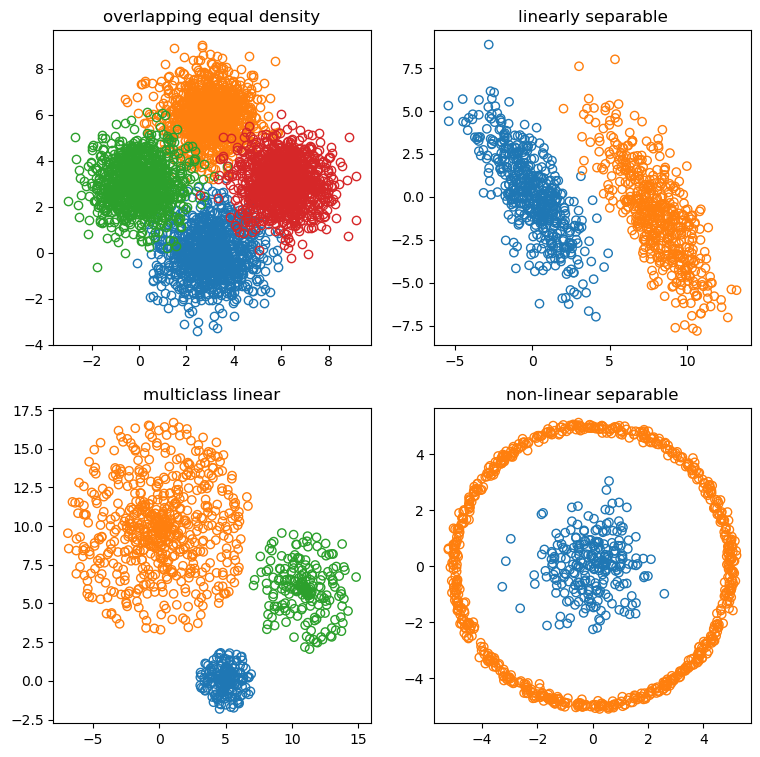

In [6]:
num = 1000
plt.figure(figsize=(9, 9))

# Generate dataset 1 : clover
a = np.concatenate([np.random.normal(loc=0.0,scale=1.0,size=(num,1)),np.random.normal(loc=0.0,scale=1.0,size=(num,1))],axis=1)
a +=  np.array([3.0,0.0])
b = np.concatenate([np.random.normal(loc=0.0,scale=1.0,size=(num,1)),np.random.normal(loc=0.0,scale=1.0,size=(num,1))],axis=1)
b += np.array([3.0,6.0])
c = np.concatenate([np.random.normal(loc=0.0,scale=1.0,size=(num,1)),np.random.normal(loc=0.0,scale=1.0,size=(num,1))],axis=1)
c += np.array([0.0,3.0])
d = np.concatenate([np.random.normal(loc=0.0,scale=1.0,size=(num,1)),np.random.normal(loc=0.0,scale=1.0,size=(num,1))],axis=1)
d += np.array([6.0,3.0])
data1 = np.concatenate([a,b,c,d],axis=0)
plt.subplot(221)
plt.plot(a[:,0],a[:,1],linestyle='None',marker='o',markerfacecolor='None')
plt.plot(b[:,0],b[:,1],linestyle='None',marker='o',markerfacecolor='None')
plt.plot(c[:,0],c[:,1],linestyle='None',marker='o',markerfacecolor='None')
plt.plot(d[:,0],d[:,1],linestyle='None',marker='o',markerfacecolor='None')
plt.title('overlapping equal density')

# Generate dataset 2 : offset gaussians (1/2, 1/2 distribution)
a = np.concatenate([np.random.normal(loc=0.0,scale=3.0,size=(int(num/2),1)),np.random.normal(loc=0.0,scale=1.0,size=(int(num/2),1))],axis=1)
a = rotate(a,45) 
b = np.concatenate([np.random.normal(loc=0.0,scale=3.0,size=(int(num/2),1)),np.random.normal(loc=0.0,scale=1.0,size=(int(num/2),1))],axis=1)
b = rotate(b,45) + np.array([8.0,-1.0])
data2 = np.concatenate([a,b],axis=0)
data2_y = np.array([0]*len(a) + [1]*len(b)) # 0/1 classes
plt.subplot(222)
plt.scatter(data2[:,0],data2[:,1],facecolor='None',marker='o',edgecolors=cm.tab10(list(data2_y)))
plt.title('linearly separable')

# Generate dataset 3 : blobs with varying density (3/5, 1/5, 1/5 distribution)
r = np.random.uniform(low=0.0,high=2.0,size=(int(num/5),1))
theta = np.random.uniform(low=0.0,high=np.pi*2.0,size=(int(num/5),1))
a = np.concatenate([r*np.cos(theta),r*np.sin(theta)],axis=1) + np.array([5.0,0])
r = np.random.uniform(low=0.0,high=7.0,size=(int(num*3/5),1))
theta = np.random.uniform(low=0.0,high=np.pi*2.0,size=(int(num*3/5),1))
b = np.concatenate([r*np.cos(theta),r*np.sin(theta)],axis=1) + np.array([0.0,10.0])
r = np.random.uniform(low=0.0,high=4.0,size=(int(num/5),1))
theta = np.random.uniform(low=0.0,high=np.pi*2.0,size=(int(num/5),1))
c = np.concatenate([r*np.cos(theta),r*np.sin(theta)],axis=1) + np.array([11.0,6.0])
data3 = np.concatenate([a,b,c],axis=0)
data3_y = np.array([0]*len(a) + [1]*len(b) + [2]*len(c))
plt.subplot(223)
plt.scatter(data3[:,0],data3[:,1],facecolor='None',marker='o',edgecolors=cm.tab10(list(data3_y)))
plt.title('multiclass linear')

# Generate dataset 4: ring with bullseye (3/4, 1/4 distribution)
a = np.concatenate([np.random.normal(loc=0.0,scale=1.0,size=(int(num/4),1)),np.random.normal(loc=0.0,scale=1.0,size=(int(num/4),1))],axis=1)
r = np.random.normal(loc=5.0,scale=0.1,size=(int(num*3/4),1))
theta = np.random.uniform(low=0.0,high=np.pi*2.0,size=(int(num*3/4),1))
b = np.concatenate([r*np.cos(theta),r*np.sin(theta)],axis=1)
data4 = np.concatenate([a,b],axis=0)
data4_y = np.array([0]*len(a) + [1]*len(b))
plt.subplot(224)
plt.scatter(data4[:,0],data4[:,1],facecolor='None',marker='o',edgecolors=cm.tab10(list(data4_y)))
plt.title('non-linear separable')


Notes on these sets:

1. the clusters are similar size, round, overlapping
2. clusters are linearly separable, but elliptical
3. clusters are round, non-overlapping, and different density
4. clusters are non-overlapping but also non-linearly separable.

Density distribution, cluster shape, and topology are all important variables that affect different clustering algorithms. We'll investigate these aspects in detail for k-means, then discuss the other algorithms in summary fashion. 

(sec-us-overlap)=
#### Overlaps ####
Overlaps are the most fundmental problem for any clustering algorithm. Since the basis for clustering is separability of either $\mathbf{x}$ or $\mathbf{y}$ in feature or label space, respectively, overlaps are going to be a challenge. At some point, strongly overlapping clusters, simply become one cluster, depending on what your priors are. Some algorithms will give you a probability or confidence in assignment, or like k-means they will just give you an assignment and you can indirectly infer confidence based on distance from the cluster centroid or silhouette score.   

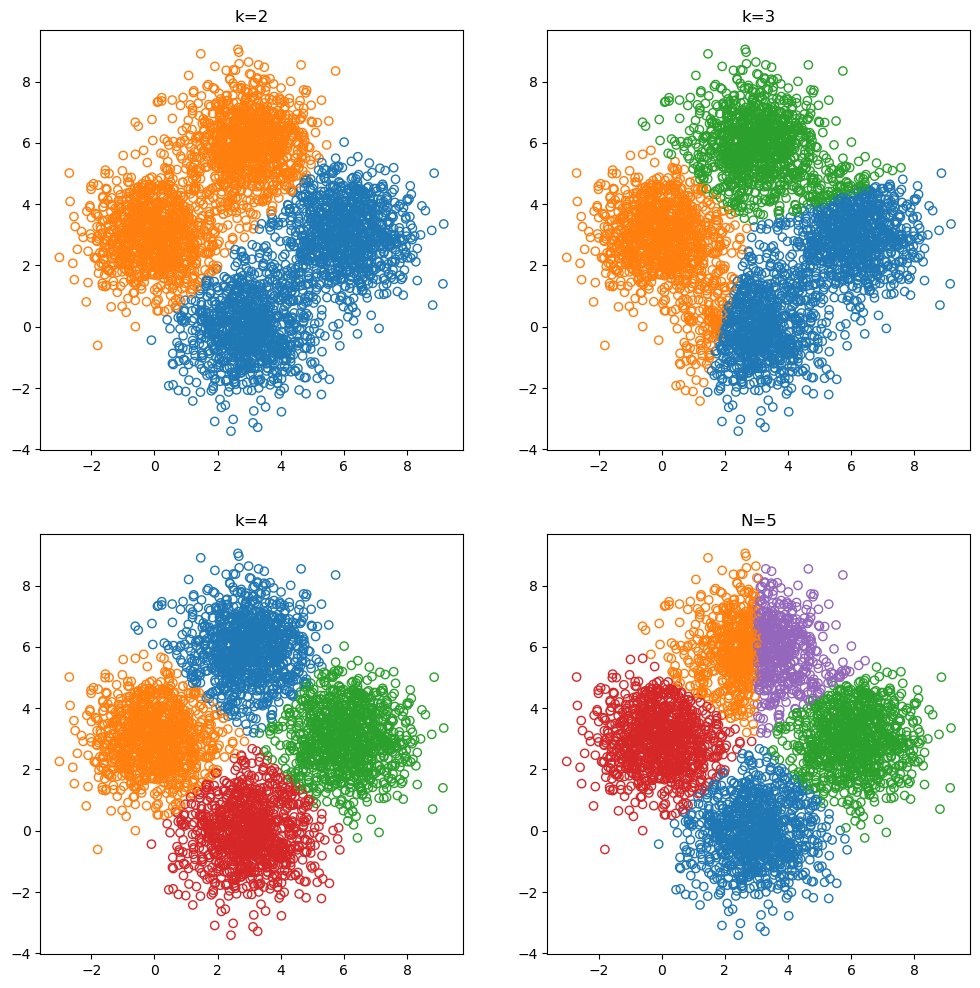

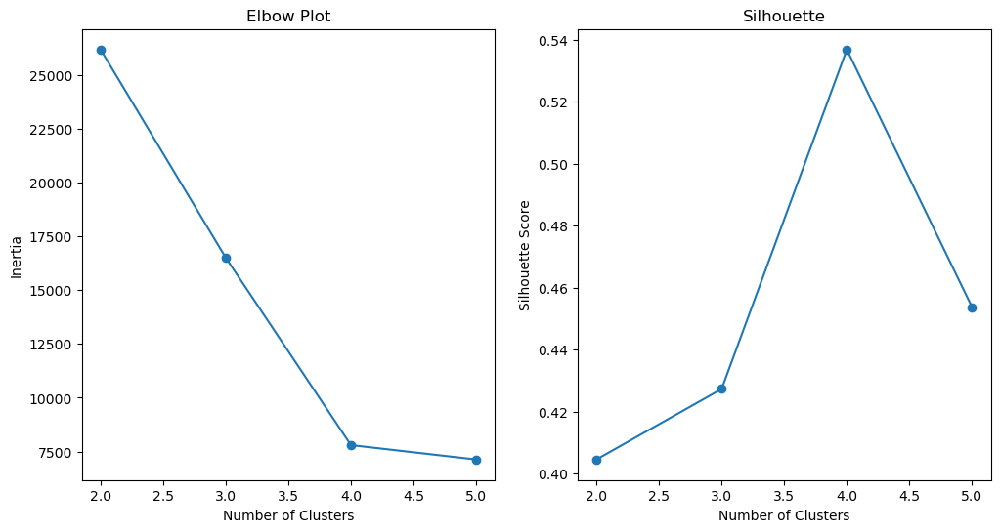

In [7]:
# Initialize intertia and silhouette scores
I = []
S = []
plt.figure(figsize=(12, 12))

# 2 cluster fit
model = KMeans(n_clusters=2).fit(data1)
labels = model.predict(data1)
I += [model.inertia_]
S += [silhouette_score(data1,labels)]
plt.subplot(221)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=2")

# 3 cluster fit
model = KMeans(n_clusters=3).fit(data1)
labels = model.predict(data1)
I += [model.inertia_]
S += [silhouette_score(data1,labels)]
plt.subplot(222)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=3")

# 4 cluster fit
model = KMeans(n_clusters=4).fit(data1)
labels = model.predict(data1)
I += [model.inertia_]
S += [silhouette_score(data1,labels)]
plt.subplot(223)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=4")

# 5 cluster fit
model = KMeans(n_clusters=5).fit(data1)
labels = model.predict(data1)
I += [model.inertia_]
S += [silhouette_score(data1,labels)]
plt.subplot(224)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("N=5")

plt.show()

# Elbow and Silhouette Plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(range(2,6),I,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot")
plt.subplot(122)
plt.plot(range(2,6),S,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette")
plt.show()

In this case, the inflection point in the inertia elbow-plot and the maximum silhouette score agree. We also see that k-means essentially draws linear boundaries and can't discriminate between overlapping values. 

(sec-us-nonsphere)=
#### Non-Spherical Clusters ####

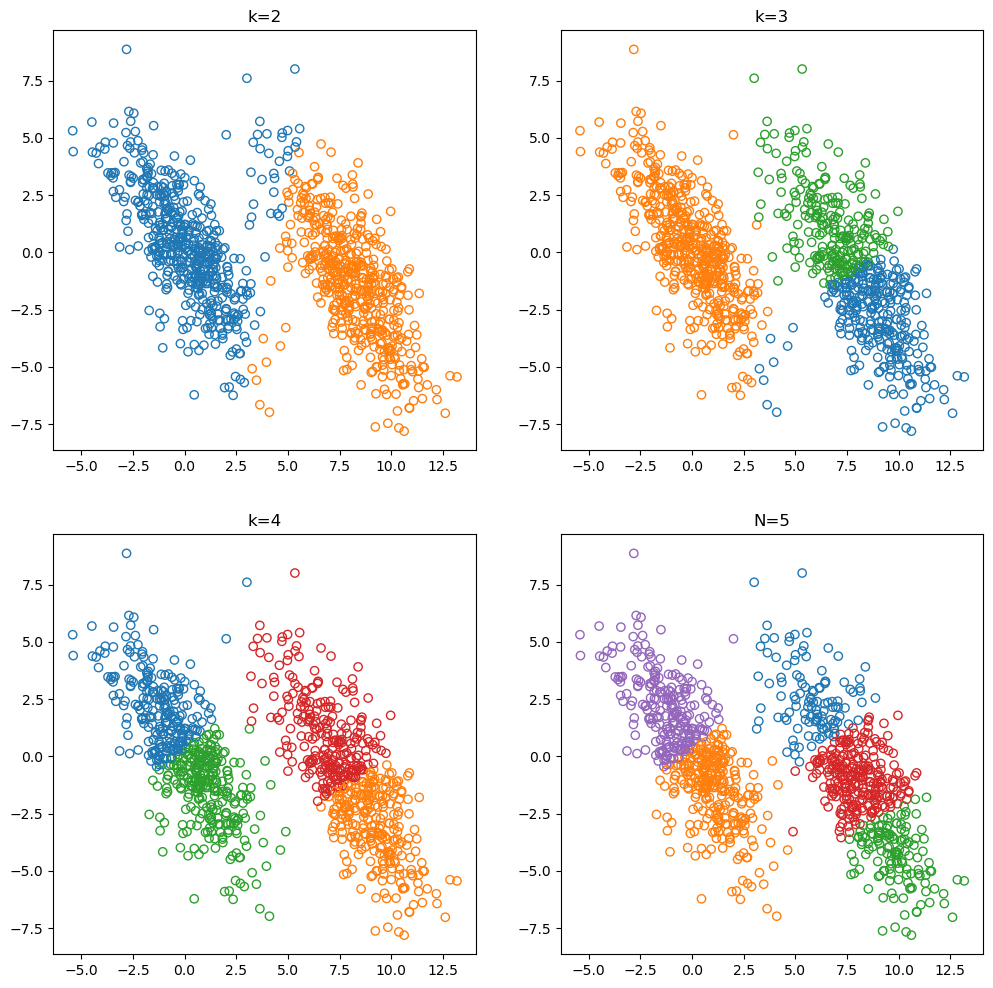

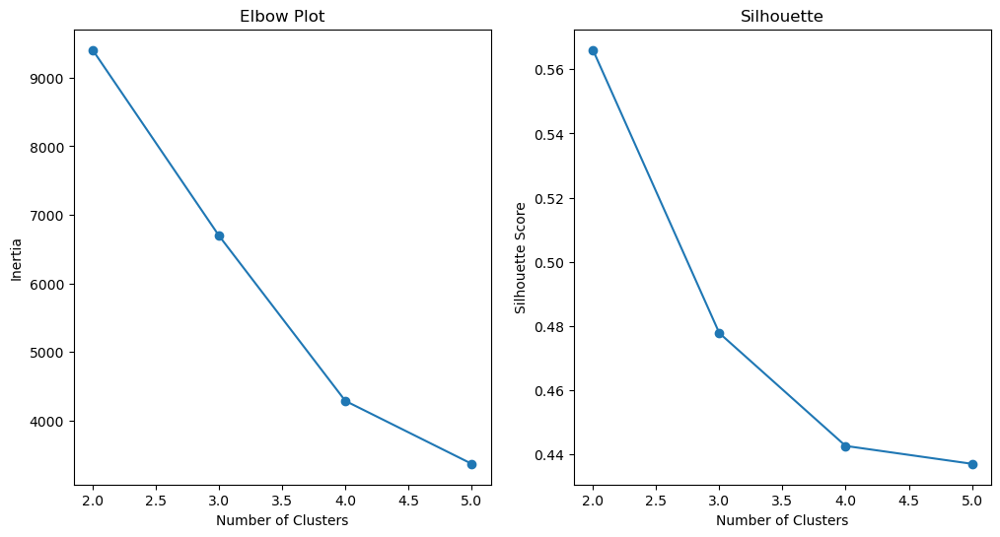

In [8]:
# Initialize intertia and silhouette scores
I = []
S = []
plt.figure(figsize=(12, 12))

# 2 cluster fit
model = KMeans(n_clusters=2).fit(data2)
labels = model.predict(data2)
I += [model.inertia_]
S += [silhouette_score(data2,labels)]
plt.subplot(221)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=2")

# 3 cluster fit
model = KMeans(n_clusters=3).fit(data2)
labels = model.predict(data2)
I += [model.inertia_]
S += [silhouette_score(data2,labels)]
plt.subplot(222)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=3")

# 4 cluster fit
model = KMeans(n_clusters=4).fit(data2)
labels = model.predict(data2)
I += [model.inertia_]
S += [silhouette_score(data2,labels)]
plt.subplot(223)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=4")

# 5 cluster fit
model = KMeans(n_clusters=5).fit(data2)
labels = model.predict(data2)
I += [model.inertia_]
S += [silhouette_score(data2,labels)]
plt.subplot(224)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("N=5")

plt.show()

# Elbow and Silhouette Plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(range(2,6),I,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot")
plt.subplot(122)
plt.plot(range(2,6),S,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette")
plt.show()

Here the elbow and silhouette scores disagree again. Both are intuitive partitionings, but neither is very good. This is because k-means has a bias towards spherical clusters, so the elongation present in this dataset leads to quite poor partitions. One way around this is to transform the data first using PCA or non-linear distance kernel (XXX Add to notes in future XXX), but for now we just note that this is a common failure mode for clustering algorithms.  

(sec-us-density)=
#### Varying Density ####


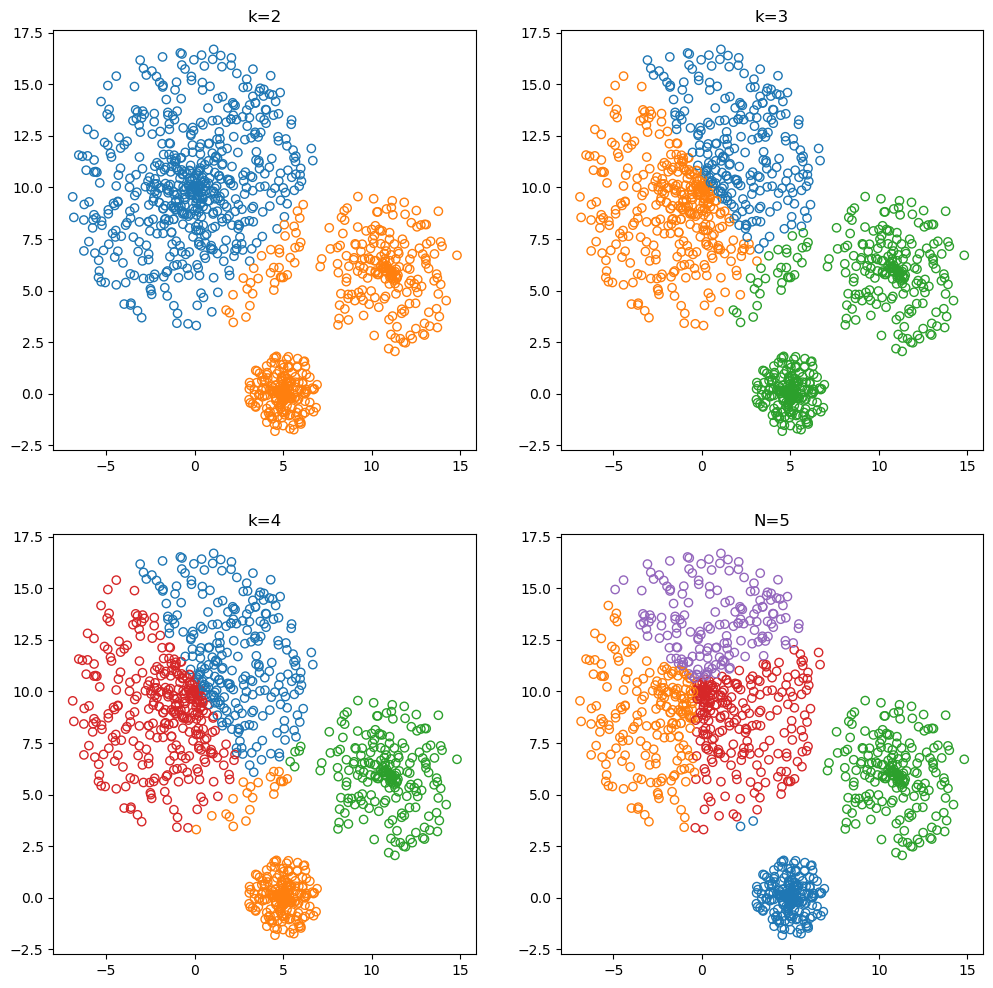

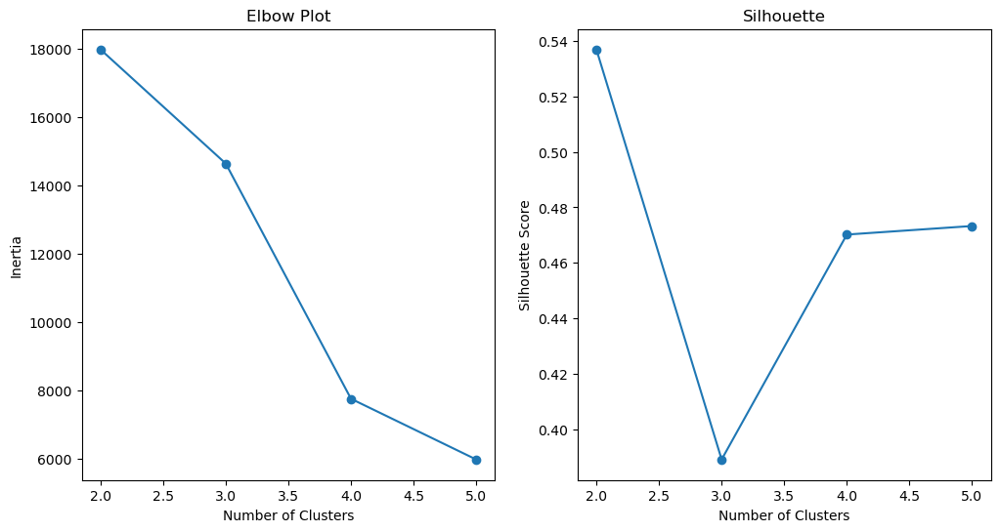

In [9]:
# Initialize intertia and silhouette scores
I = []
S = []
plt.figure(figsize=(12, 12))

# 2 cluster fit
model = KMeans(n_clusters=2).fit(data3)
labels = model.predict(data3)
I += [model.inertia_]
S += [silhouette_score(data3,labels)]
plt.subplot(221)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=2")

# 3 cluster fit
model = KMeans(n_clusters=3).fit(data3)
labels = model.predict(data3)
I += [model.inertia_]
S += [silhouette_score(data3,labels)]
plt.subplot(222)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=3")

# 4 cluster fit
model = KMeans(n_clusters=4).fit(data3)
labels = model.predict(data3)
I += [model.inertia_]
S += [silhouette_score(data3,labels)]
plt.subplot(223)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=4")

# 5 cluster fit
model = KMeans(n_clusters=5).fit(data3)
labels = model.predict(data3)
I += [model.inertia_]
S += [silhouette_score(data3,labels)]
plt.subplot(224)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("N=5")

plt.show()

# Elbow and Silhouette Plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(range(2,6),I,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot")
plt.subplot(122)
plt.plot(range(2,6),S,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette")
plt.show()

In this case, the inflection point and maximum for the silhouette score are much less pronounced (note the y-axis in the latter case). This is because k-means has a difficult time with clusters with large variance differences. The origin of this behavior is that the edges of a large cluster can be closer to the centroid of a small cluster, even when there is a clean separation between the two. In the current case, this leads to parts of the bottom-right of the large cluster getting assigned to the others. Some algorithms are better at dealing with this than others. K-means is arguably the simplest unsupervised algorithm, and so it gets broken pretty easily by all of the pathologies. Nevertheless, many unsupervised algorithms try to use the density as a basis for forming clusters, and can yield counter-intuitive clusterings for similar reasons. 

(sec-us-nonlinear)=
#### Non-Linear Clusters ####


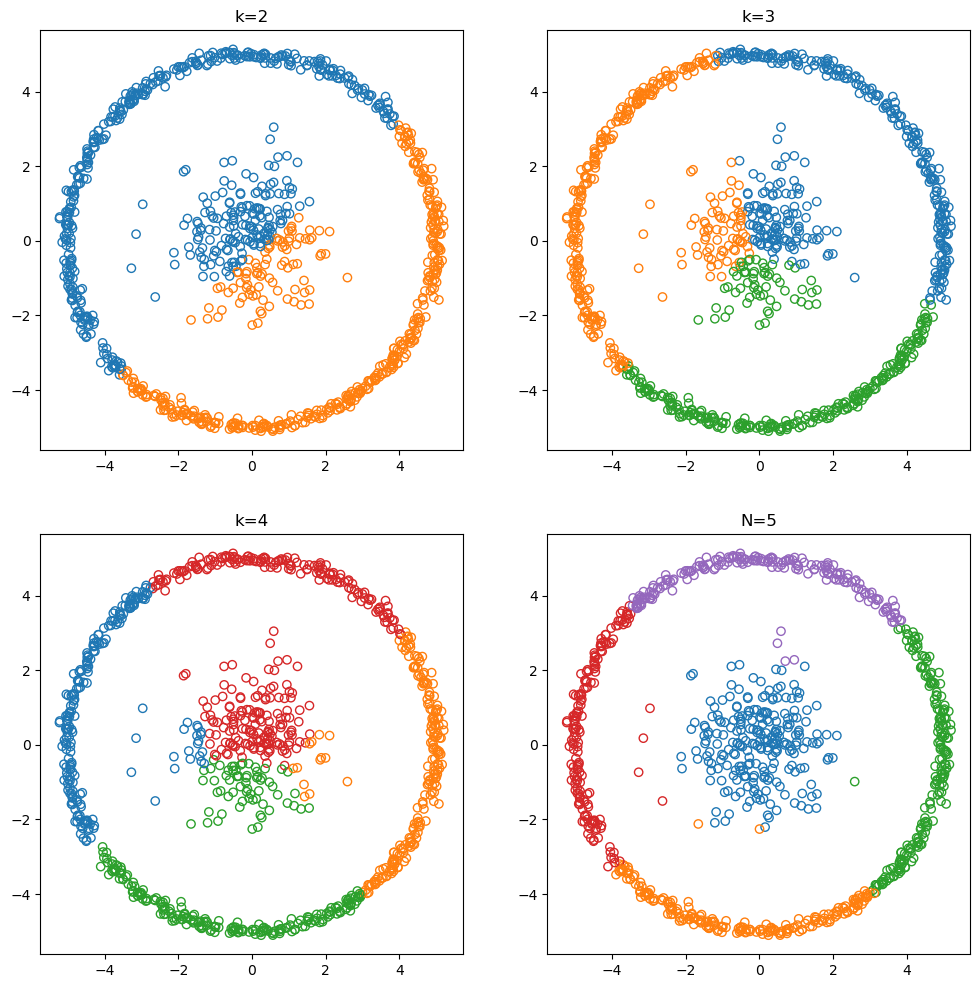

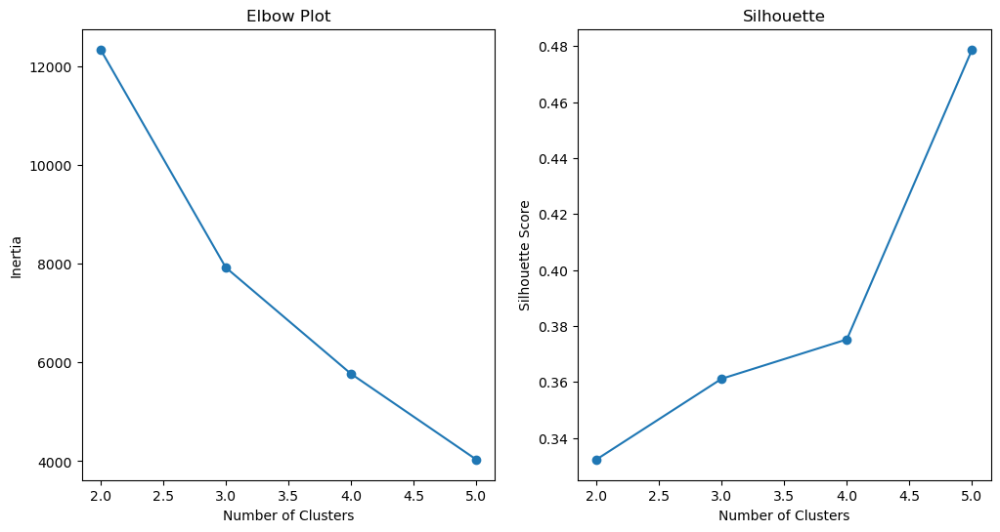

In [10]:
# Initialize intertia and silhouette scores
I = []
S = []
plt.figure(figsize=(12, 12))

# 2 cluster fit
model = KMeans(n_clusters=2).fit(data4)
labels = model.predict(data4)
I += [model.inertia_]
S += [silhouette_score(data4,labels)]
plt.subplot(221)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=2")

# 3 cluster fit
model = KMeans(n_clusters=3).fit(data4)
labels = model.predict(data4)
I += [model.inertia_]
S += [silhouette_score(data4,labels)]
plt.subplot(222)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=3")

# 4 cluster fit
model = KMeans(n_clusters=4).fit(data4)
labels = model.predict(data4)
I += [model.inertia_]
S += [silhouette_score(data4,labels)]
plt.subplot(223)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=4")

# 5 cluster fit
model = KMeans(n_clusters=5).fit(data4)
labels = model.predict(data4)
I += [model.inertia_]
S += [silhouette_score(data4,labels)]
plt.subplot(224)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("N=5")

plt.show()

# Elbow and Silhouette Plot
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(range(2,6),I,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot")
plt.subplot(122)
plt.plot(range(2,6),S,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette")
plt.show()

Similar to the case of elliptical clusters, non-linearly separable clusters are essentially hopeless for k-means. This is because it uses the centroid to assign clusters, and in the current example the centroid of the two clusters is nearly identical. Interestingly, the silhouette score exhibits a relatively strong preference for the k=5 partitioning, which is sensible since that is that only one that keeps the central cluster intact. Still, things aren't great, and a lot of algorithms break on non-linear clustering relationships.

(sec-us-minibatch)=
### Mini-Batch K-Means ###
In the original K-Means algorithm we looped over all of the data at each step then assigned the means. A variant of this algorithm is called "Mini-Batch" K-Means, in which the new cluster means are recalculated after sampling only a random "batch" of points. This approach is much faster than K-Means for large datasets. 

Do you notice the similarity with stochastic and mini-batch gradient descent? Stochastic and batch variations are common for many algorithms. The relevant scikit-learn class is `sklearn.cluster.MiniBatchKMeans`.


Text(0.5, 1.0, 'k=5')

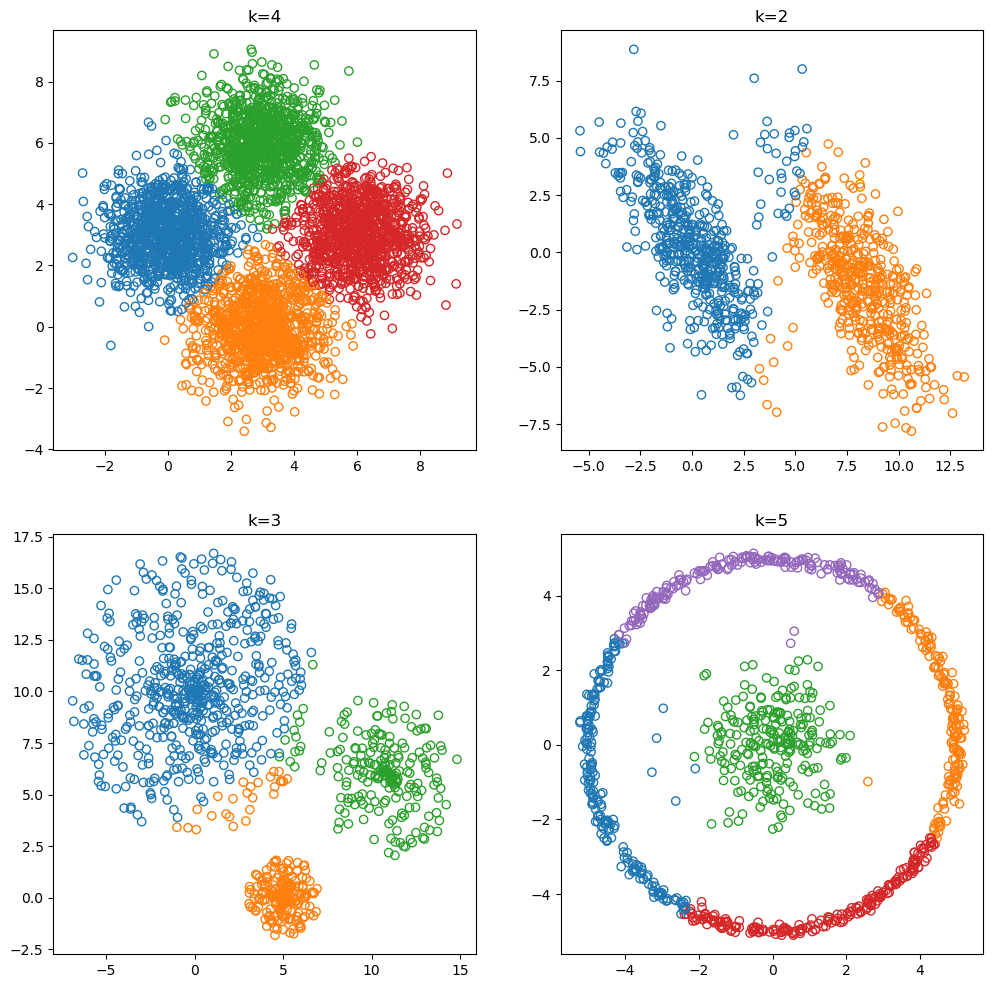

In [11]:
from sklearn.cluster import MiniBatchKMeans

plt.figure(figsize=(12, 12))

# data1
labels = MiniBatchKMeans(n_clusters=4).fit_predict(data1)
plt.subplot(221)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=4")

# data2
labels = MiniBatchKMeans(n_clusters=2).fit_predict(data2)
plt.subplot(222)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=2")

# data3
labels = MiniBatchKMeans(n_clusters=3).fit_predict(data3)
plt.subplot(223)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=3")

# data4
labels = MiniBatchKMeans(n_clusters=5).fit_predict(data4)
plt.subplot(224)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("k=5")

The performance of minibatch k-means is almost identical to k-means in the first three cases. With some experiment with the batchsize, the errors associated with using batch vs the full optimization are usually small. 

(sec-us-gmm)=
### Gaussian Mixtures 
Gaussian Mixtures is a clustering algorithm that tries to assign k n-dimensional gaussians of unknown mean and variance to describe the data. The optimization of parameters is accomplished through expectation-maximization. Although this is fundamentally different than k-means, the results of Gaussian Mixture models are typically very similar to K-Means, except that they support non-spherical cluster identificaton. 

Gaussian Mixtures is also a unique algorithm in the sense that it is probabilistic. The assignment of individual points is based on which gaussian it is most likely to belong to (i.e., which gaussian has the largest value at the datum). In turn, this supplies an uncertainty measure in the assignment (e.g., points at the edge of boundaries will typically have large values from several gaussians). 

Gaussian Mixtures is implemented in scikit-learn through the `GaussianMixture` object in the `sklearn.mixture` library. The number of clusters is passed via the `n_components` parameter. Examples of its use are shown in the cell below. 

Text(0.5, 1.0, 'GM,N=2,data4')

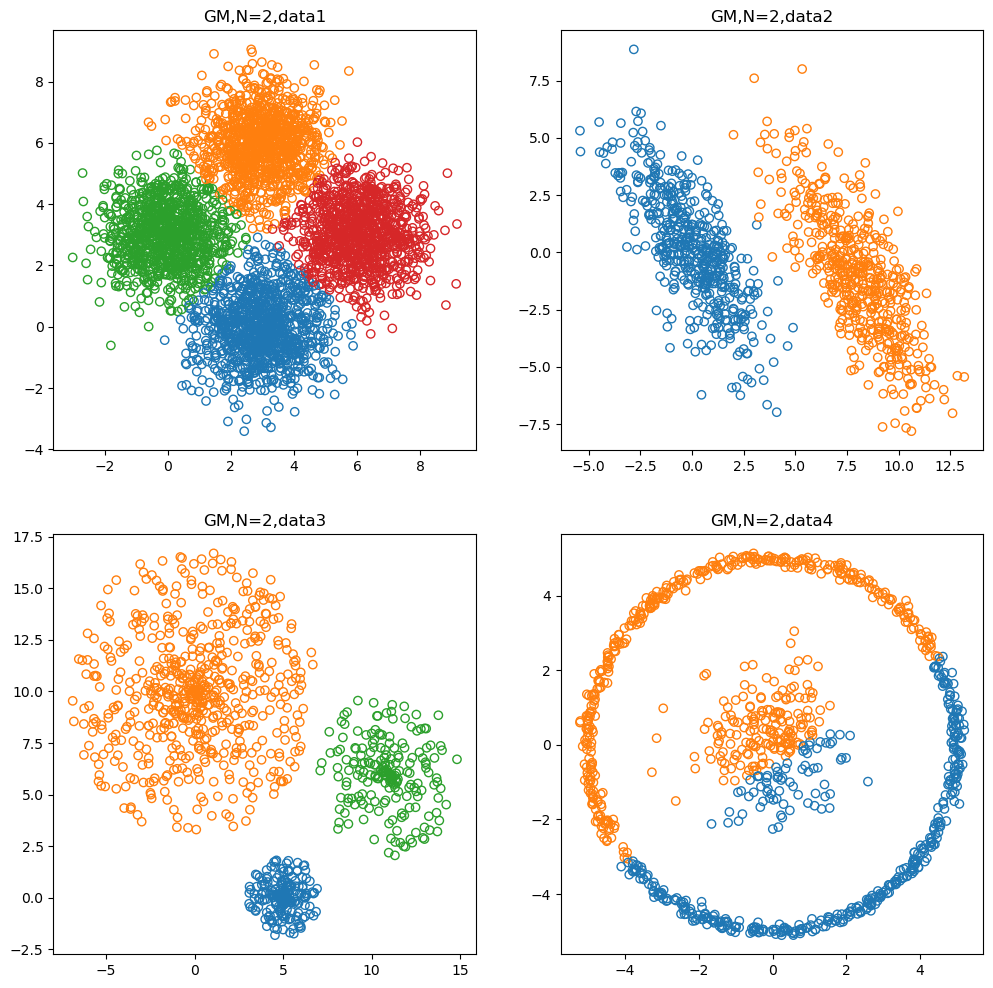

In [12]:
from sklearn.mixture import GaussianMixture

plt.figure(figsize=(12, 12))

# GM - 2 cluster - data2
labels = GaussianMixture(n_components=4).fit_predict(data1)
plt.subplot(221)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data1")

# GM - 2 cluster - data2
labels = GaussianMixture(n_components=2).fit_predict(data2)
plt.subplot(222)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data2")

# GM - 3 cluster - data3
labels = GaussianMixture(n_components=3).fit_predict(data3)
plt.subplot(223)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data3")

# GM - 2 cluster - data4
labels = GaussianMixture(n_components=2).fit_predict(data4)
plt.subplot(224)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data4")

(sec-us-dbscan)=
### DBSCAN ###
Density-based spatial clustering of applications with noise, or <b>DBSCAN</b>, is a clustering algorithm that is based on density. In DBSCAN cluster assignment is based on finding regions of "high" density separated by "low density. Since the definition of "high" and "low" is application dependent, it is controlled by two parameters, `eps` and `min_samples`. Here, `eps` is a distance which is used to define if two points are close to one another, and `min_samples` is the minimum number of close neighbors that must exist for a datum to be considered in a "high density" region. Distinct high density regions are identified by identifying high-density datum, finding their high-density neighbors, and their high-density neighbors, etc until no more neighbors are found. DBSCAN replaces the need to supply the number of clusters with the need to assign the `eps` and `min_samples` parameters. 

DBSCAN is generally very robust, albeit sensitive to the specific choice of `eps` and `min_samples`. Since it is based on density, it can also handle complex topologies. DBSCAN is also unique in that not all data gets assigned to clusters. Those that reside in "low density" regions are considered outliers and left out of assignment. 

DBSCAN is implemented in scikit-learn thhrough the `DBSCAN` object in the `cluster` library:

Text(0.5, 1.0, 'DBSCAN,data4')

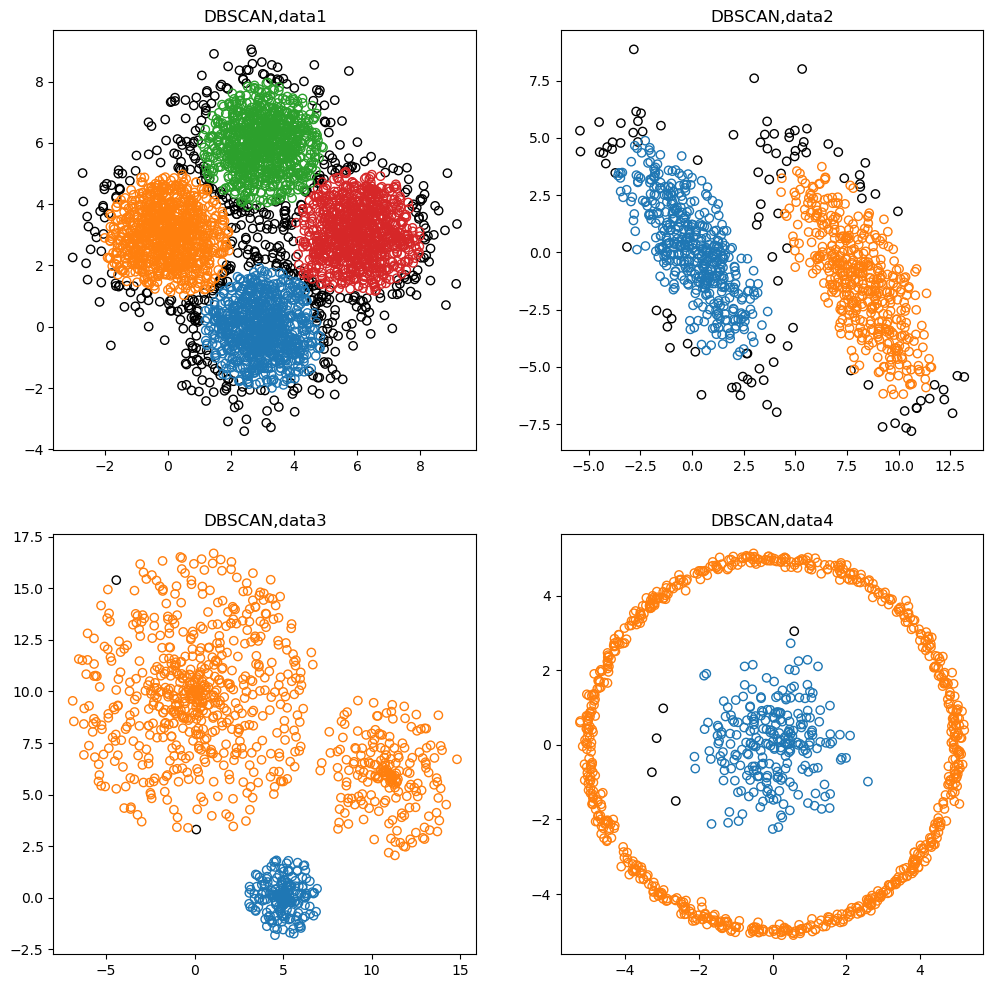

In [13]:
# NOTE: HDBSCAN is generally superior and only requires a min_cluster_size argument, however
#       it is not currently part of the scikit learn package and needs to be imported separately.
from sklearn.cluster import DBSCAN

plt.figure(figsize=(12, 12))

# DBSCAN - data1

labels = DBSCAN(min_samples=100,eps=0.7).fit_predict(data1)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(221)
plt.scatter(data1[u_inds,0],data1[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data1[a_inds,0],data1[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data1")

# DBSCAN - data2
labels = DBSCAN(min_samples=20,eps=1.0).fit_predict(data2)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(222)
plt.scatter(data2[u_inds,0],data2[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data2[a_inds,0],data2[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
#plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("DBSCAN,data2")

# DBSCAN - data3 (SHOULD ALSO TEST WITH eps=1.9 to illustrate the difficulty with varying density)
labels = DBSCAN(min_samples=20,eps=1.8).fit_predict(data3)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(223)
plt.scatter(data3[u_inds,0],data3[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data3[a_inds,0],data3[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data3")

# DBSCAN - data4
labels = DBSCAN(min_samples=20,eps=1.0).fit_predict(data4)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(224)
plt.scatter(data4[u_inds,0],data4[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data4[a_inds,0],data4[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data4")


Spend a few minutes experimenting with the effect of the `min_samples` and `eps` parameters in the above cell.

(sec-us-hier)=
### Hierachical Clustering ###
Hierarchical clustering refers to a family of methods for assigning a "hierarchy" of different cluster assignments based on either splitting clusters (top-down), or combining clusters (bottom-up). These methods are unique in that they generate a whole "dendrogram" of cluster assignments, with the specific cluster assigment determined being a slice of this larger hierarchy. Hierarchical methods typically vary based on how they combine or split clusters and whether they are top-down or bottom-up. 

In general hierarchical methods are very robust, but sensitive to the "linkage" criteria used for determining splitting or combination. Since they do not use distance, these methods can identify complex topologies. Depending on the linkage, these algorithms may favor clusters with similar number of samples.

In scikit-learn the bottom-up hierarchical method known as "Agglomerative Clustering" is implemented using the `AgglomerativeClustering` object in the `cluster` library:

Text(0.5, 1.0, 'HC,N=2,data4')

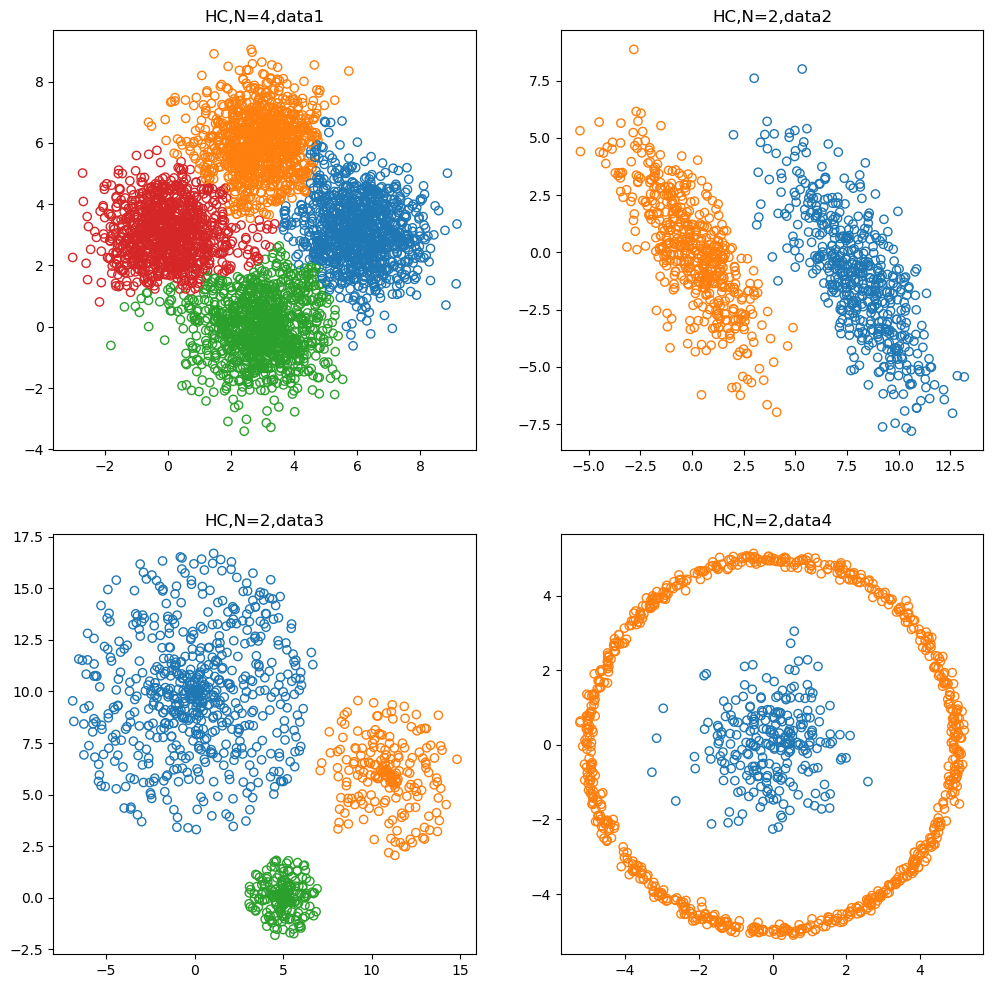

In [14]:
from sklearn.cluster import AgglomerativeClustering

plt.figure(figsize=(12, 12))

# Hierarchical Clustering - data1
labels = AgglomerativeClustering(n_clusters=4).fit_predict(data1)
plt.subplot(221)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=4,data1")

# Hierarchical Clustering - data2
labels = AgglomerativeClustering(n_clusters=2).fit_predict(data2)
plt.subplot(222)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data2")

# Hierarchical Clustering - data3
labels = AgglomerativeClustering(n_clusters=3).fit_predict(data3)
plt.subplot(223)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data3")

# Hierarchical Clustering - data4 (NOTE: linkage criteria significantly affects results in this case)
labels = AgglomerativeClustering(n_clusters=2,linkage='single').fit_predict(data4)
plt.subplot(224)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data4")

Spend a few minutes looking at the scikit-learn documentation and experimenting with the effect of the `linkage` parameter in the above cell.

(sec-us-compare)=
### Comparison of Methods ###

Text(0.5, 1.0, 'HC,N=2,data4')

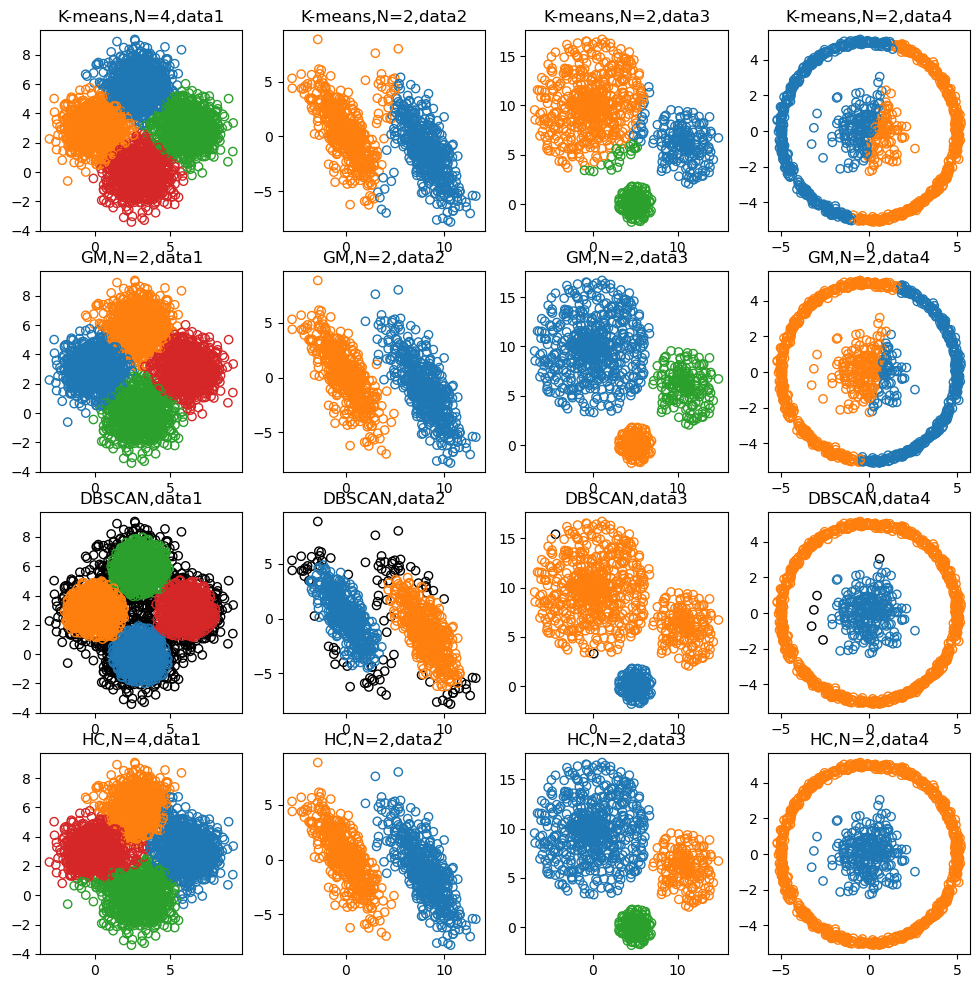

In [15]:
# Generate large multipanel comparison plot
plt.figure(figsize=(12, 12))

# kmeans - 4 cluster - data1
labels = KMeans(n_clusters=4).fit_predict(data1)
plt.subplot(441)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("K-means,N=4,data1")

# kmeans - 2 cluster - data2
labels = KMeans(n_clusters=2).fit_predict(data2)
plt.subplot(442)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("K-means,N=2,data2")

# kmeans - 3 cluster - data3
labels = KMeans(n_clusters=3).fit_predict(data3)
plt.subplot(443)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("K-means,N=2,data3")

# kmeans - 2 cluster - data4
labels = KMeans(n_clusters=2).fit_predict(data4)
plt.subplot(444)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("K-means,N=2,data4")

# GM - 2 cluster - data2
labels = GaussianMixture(n_components=4).fit_predict(data1)
plt.subplot(445)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data1")

# GM - 2 cluster - data2
labels = GaussianMixture(n_components=2).fit_predict(data2)
plt.subplot(446)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data2")

# GM - 3 cluster - data3
labels = GaussianMixture(n_components=3).fit_predict(data3)
plt.subplot(447)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data3")

# GM - 2 cluster - data4
labels = GaussianMixture(n_components=2).fit_predict(data4)
plt.subplot(448)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("GM,N=2,data4")

# NOTE: HDBSCAN is generally superior and only requires a min_cluster_size argument, however
#       it is not currently part of the scikit learn package and needs to be imported separately.
# DBSCAN - data1
labels = DBSCAN(min_samples=100,eps=0.7).fit_predict(data1)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(4,4,9)
plt.scatter(data1[u_inds,0],data1[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data1[a_inds,0],data1[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data1")

# DBSCAN - data2
labels = DBSCAN(min_samples=20,eps=1.0).fit_predict(data2)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(4,4,10)
plt.scatter(data2[u_inds,0],data2[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data2[a_inds,0],data2[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
#plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("DBSCAN,data2")

# DBSCAN - data3 (SHOULD ALSO TEST WITH eps=1.9 to illustrate the difficulty with varying density)
labels = DBSCAN(min_samples=20,eps=1.8).fit_predict(data3)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(4,4,11)
plt.scatter(data3[u_inds,0],data3[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data3[a_inds,0],data3[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data3")

# DBSCAN - data4
labels = DBSCAN(min_samples=20,eps=1.0).fit_predict(data4)
u_inds = np.where(labels == -1)
a_inds = np.where(labels != -1)
plt.subplot(4,4,12)
plt.scatter(data4[u_inds,0],data4[u_inds,1],facecolors='none',edgecolors='k')
plt.scatter(data4[a_inds,0],data4[a_inds,1],facecolors='none',edgecolors=cm.tab10(labels[a_inds]))
plt.title("DBSCAN,data4")

# Hierarchical Clustering - data1
labels = AgglomerativeClustering(n_clusters=4).fit_predict(data1)
plt.subplot(4,4,13)
plt.scatter(data1[:,0],data1[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=4,data1")

# Hierarchical Clustering - data2
labels = AgglomerativeClustering(n_clusters=2).fit_predict(data2)
plt.subplot(4,4,14)
plt.scatter(data2[:,0],data2[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data2")

# Hierarchical Clustering - data3
labels = AgglomerativeClustering(n_clusters=3).fit_predict(data3)
plt.subplot(4,4,15)
plt.scatter(data3[:,0],data3[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data3")

# Hierarchical Clustering - data4 (NOTE: linkage criteria significantly affects results in this case)
labels = AgglomerativeClustering(n_clusters=2,linkage='single').fit_predict(data4)
plt.subplot(4,4,16)
plt.scatter(data4[:,0],data4[:,1],facecolors='none',edgecolors=cm.tab10(labels))
plt.title("HC,N=2,data4")
